### Define class for dataset preapreations

In [1]:
from google.colab import output
import os
import gdown
import tarfile
import zipfile
import shutil
import random

import cv2
from google.colab.patches import cv2_imshow
!pip install ultralytics
from ultralytics import YOLO
from PIL import Image
# from IPython.display import Image

import locale

import torch
from torchvision.models.mobilenetv2 import mobilenet_v2
import torchvision
from torchvision import transforms
import torch.nn as nn
from torch.nn.functional import interpolate

output.clear()

In [2]:
class Downloader:

  def __init__(self, sourcesUrl,sourcePath,destinationPath):
    self.urlDataSources = sourcesUrl
    self.sourcePath=sourcePath
    self.destinationPath = destinationPath
    self.isDataSourceDownloaded = os.path.exists(self.sourcePath)
    self.isDataSourceExtract = os.path.exists(self.destinationPath)
    if self.isDataSourceDownloaded == False :
      os.mkdir(self.sourcePath)
    if self.isDataSourceExtract  == False:
      os.mkdir(self.destinationPath)


  def downloadAndExtractSourceUrl(self):
    baseUrl='https://drive.google.com/uc?id='
    if self.isDataSourceExtract:
      return
    if self.isDataSourceDownloaded == False :
      for  src in self.urlDataSources:
        gdown.download(baseUrl+src, self.sourcePath, quiet=True)

    for filename in os.listdir(self.sourcePath):
      if filename.endswith(".tar"):
        with tarfile.open(self.sourcePath+ filename, "r:gz") as tar:
          tar.extractall(path=self.destinationPath)
      # else :
      #   with zipfile.ZipFile(self.sourcePath+ filename, "r") as zip:
      #     zip.extractall(path=self.destinationPath)

  def clearTempFiles(self):
    shutil.rmtree(self.sourcePath, ignore_errors=True)

###############################################################################

class DatasetHelper:

  def __init__(self, root_path):
    self.root_path = root_path
    self.test_path =root_path +'test'
    self.train_path= root_path + 'training'
    self.val_path=root_path + 'validation'
    if not os.path.exists(self.test_path):
      os.mkdir(self.test_path)


  def  splitTrainForTest(self,testPercentage):
      lenTest= len(os.listdir(self.test_path))
      lenTrain = len(os.listdir(self.train_path))
      targetTestPercentage =testPercentage/100
      currentTestPercentage =lenTest/(lenTrain+lenTest)

      if currentTestPercentage >= targetTestPercentage  :
        return

      testp= targetTestPercentage - currentTestPercentage

      jpeg_files = [img for img in os.listdir(self.train_path) if img.endswith('.jpg')]
      num_test_files = int(len(jpeg_files) * testp)
      selected_pairs = random.sample(jpeg_files, num_test_files)

      for img in selected_pairs:
          txt = img[:-4] + '.txt'
          shutil.move(os.path.join(self.train_path, img), os.path.join(self.test_path, img))
          shutil.move(os.path.join(self.train_path, txt), os.path.join(self.test_path, txt))


  def datasetInfo(self):
    result = {"train": len(os.listdir(self.train_path)),
              "val": len(os.listdir(self.val_path)),
              "test": len(os.listdir(self.test_path))
             }
    return result

  def datasetPaths(self):
    result = {"train": self.train_path,
              "val": self.val_path,
              "test": self.test_path
             }
    return result


  def createYamelFile(self,names):
    yamelCreator = YamelFileCreator('data')
    yamelCreator.create(self.datasetPaths(),names)

##########################################################################################################

class YamelFileCreator:
  def __init__(self, yamelFileName):
    self.yamelFileName = yamelFileName

  def create(self,paths,names):
    f = open(self.yamelFileName + ".yaml", "w")
    f.write("path: \n")

    for key in paths:
      f.write(key + ': ' + paths[key] +'\n')
    f.write('\n')

    f.write('nc: '+ str(len(names)) +'\n')
    f.write('\n')

    for key in names:
      f.write(str(key) + ': ' + names[key] +'\n')
    f.write('\n')

    f.close()


### Dataset preapreation (Train, Validation, Test)

In [3]:
sourceUrl =["1IUB__JPaBj3XEtfeIVr5Tlg_SD5rwa05","1fy8dI-2dKPJprlZlZIB_XM0gh9LqL_Cn","1QxipseJnt1y5enieUUh16k22Vuhr7E6S"]
sourceDirectory = '/content/source/'
datasetDirectory = '/content/datasets/'
names={  0:'car',1:'truck',2:'van',3:'longvehicle',4: 'bus',5: 'airliner',6: 'propeller',7: 'trainer',8:'chartered',
         9: 'fighter',10:'other',11:'stairtruck',12:'pushbacktruck',13: 'helicopter',  14: 'boat'}


downloader = Downloader(sourceUrl,sourceDirectory,datasetDirectory)
downloader.downloadAndExtractSourceUrl()

datasetHelper = DatasetHelper(datasetDirectory)
datasetHelper.splitTrainForTest(15)
print(datasetHelper.datasetInfo())

datasetHelper.createYamelFile(names)


{'train': 6800, 'val': 2000, 'test': 1200}


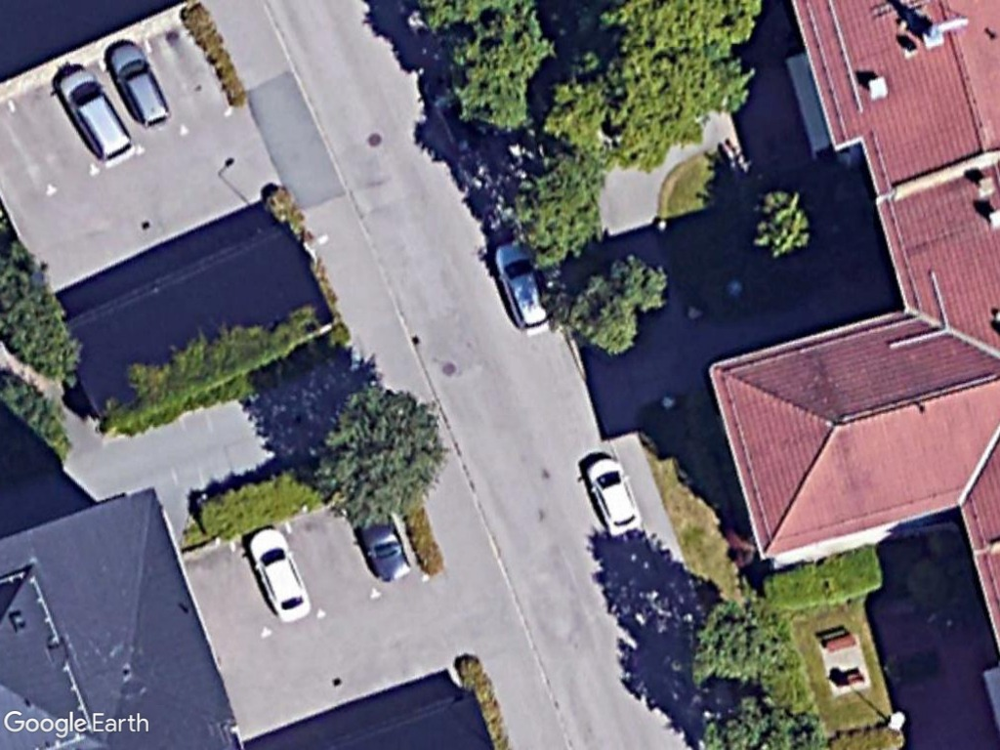

In [4]:
folder_path = "./datasets/training/"
file_list = os.listdir(folder_path)

for filename in file_list:
    if filename.endswith(".jpg"):
        image_path = os.path.join(folder_path, filename)
        img =  cv2.imread(image_path)
        cv2_imshow(img)
        print("img_size:")
        print(img.shape)

        txt_file_name = filename.replace(".jpg", ".txt")
        txt_file_path = os.path.join(folder_path, txt_file_name)

        # open the text file and print its contents
        with open(txt_file_path, "r") as f:
            txt_contents = f.read()
            print(txt_contents)
        break

In [ ]:
# !pip install ultralytics
# output.clear()

In [ ]:
model_v8 = YOLO("yolov8n.yaml")
results_v8 = model_v8.train(data="data.yaml", epochs=1, imgsz=1024, rect=True, batch=4)

In [ ]:
results_val_v8 = model_v8.val()

Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3008573 parameters, 0 gradients
val: Scanning /content/datasets/validation.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 250/250 [00:29<00:00,  8.55it/s]
                   all       1000       9726    0.00514      0.255    0.00848    0.00261
               class_0       1000       4263     0.0279      0.448     0.0413     0.0129
               class_1       1000        545     0.0114      0.506     0.0181    0.00586
               class_2       1000       1023     0.0151        0.6     0.0367     0.0116
               class_3       1000        270    0.00417      0.159    0.00328   0.000609
               class_4       1000        411    0.00715      0.131      0.006     0.0014
               class_5       1000 

In [ ]:
# %tensorboard --logdir runs

In [ ]:
# from PIL
im1 = Image.open("datasets/validation/0011.jpg")
results = model_v8.predict(source=im1, save=True)
print(results)
display(Image.open('runs/detect/predict/0011.jpg'))

In [ ]:
%%shell
git clone https://github.com/ultralytics/yolov5
cd yolov5
pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16008, done.
remote: Total 16008 (delta 0), reused 0 (delta 0), pack-reused 16008
Receiving objects: 100% (16008/16008), 14.56 MiB | 2.14 MiB/s, done.
Resolving deltas: 100% (11011/11011), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00


In [ ]:
locale.getpreferredencoding = lambda: "UTF-8"
!python /content/yolov5/train.py --img 640 --batch 4 --epochs 1 --data data.yaml --weights yolov5s.pt --rect

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=4, imgsz=640, rect=True, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hs

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir logs
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/exp

<IPython.core.display.Javascript object>

In [ ]:
# !ps aux | grep tensorboard
# ! kill #

root       20464  0.9  3.7 2157368 494624 ?      Sl   17:10   0:05 /usr/bin/python3 /usr/local/bin/tensorboard --logdir logs
root       22840  0.0  0.0   6904  3180 ?        S    17:20   0:00 /bin/bash -c ps aux | grep tensorboard
root       22842  0.0  0.0   6444   660 ?        S    17:20   0:00 grep tensorboard


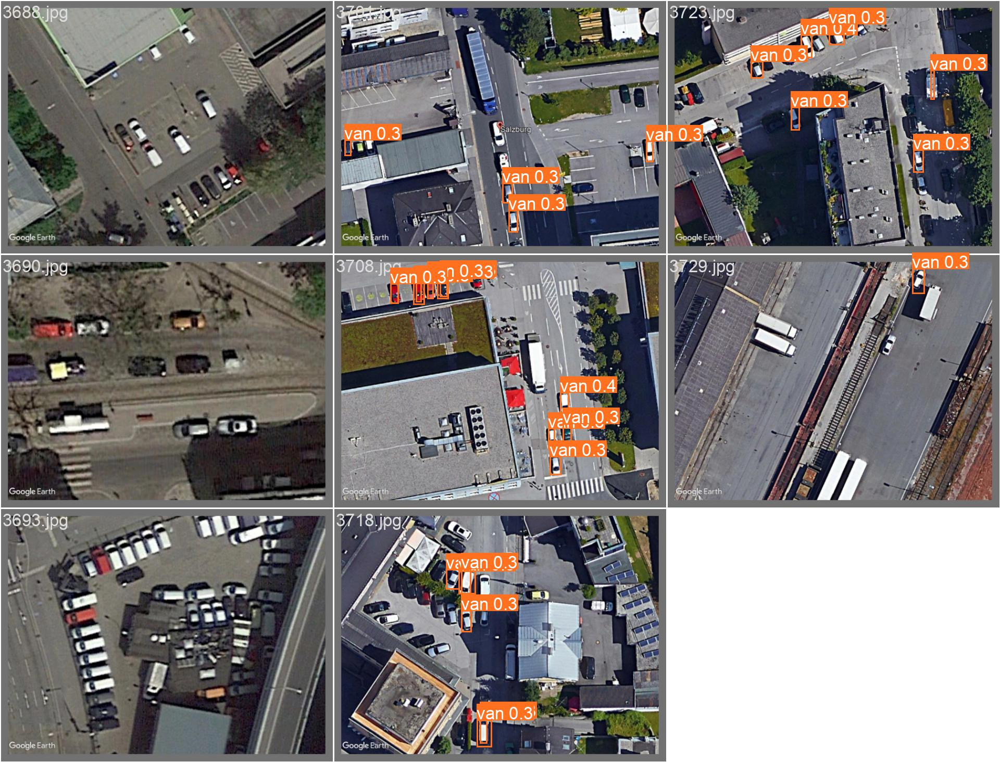

In [ ]:
# filename path needs to be modified: exp > exp2
from IPython.display import Image

Image(filename='/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1000)

In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir runs

In [ ]:
# might need modifications
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data /content/data.yaml --img 640 --half

val: data=/content/data.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/datasets/validation.cache... 1000 images, 0 backgrounds, 0 corrupt: 100% 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:  31% 10/32 [00:16<00:34,  1.55s/it]WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 32/32 [00:39<00:00,  1.23s/it]
                   all  

In [ ]:
# --weights path may need to be changed: exp > exp2

test_folder = '/content/datasets/test'
test_sample = random.choice(os.listdir(test_folder))
if test_sample.endswith('.jpg'):
  image_path = os.path.join(test_folder, test_sample)
else:
  test_sample = test_sample[:-4] + '.jpg'
  image_path = os.path.join(test_folder, test_sample)

!python /content/yolov5/detect.py --source {image_path}  --weights /content/yolov5/runs/train/exp/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/test/0535.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-187-g0004c74 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/datasets/test/0535.jpg: 480x640 1 airliner, 41.9ms
Speed: 0.5ms pre-process, 41.9ms inference, 1.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/detect/exp


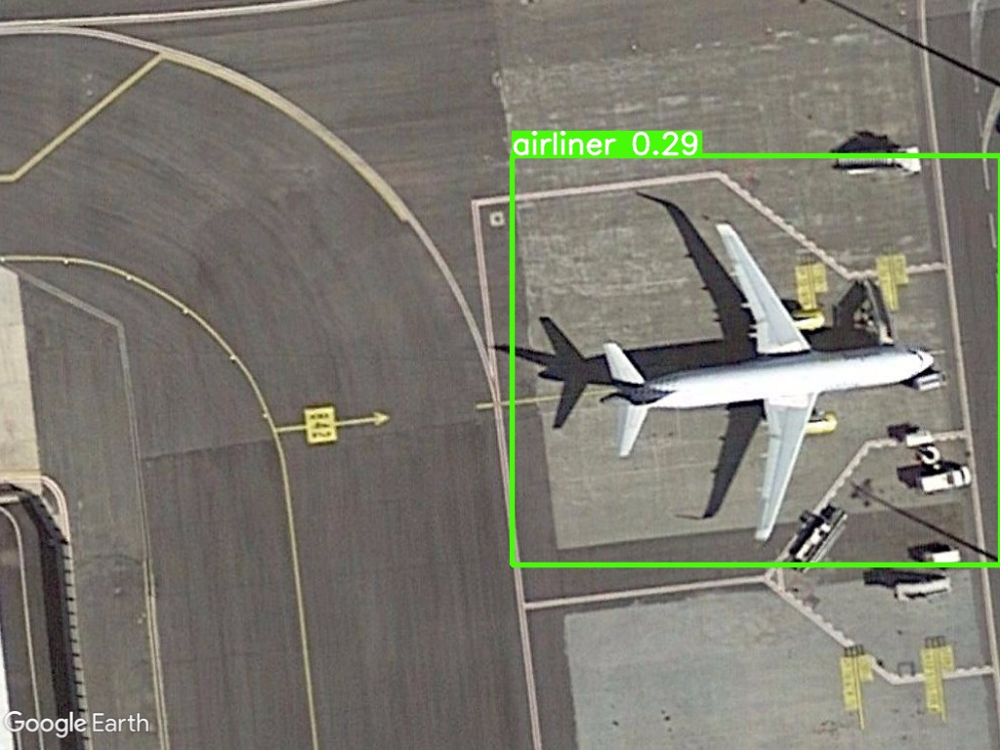

In [ ]:
# filename path needs to be modified

Image(filename=f'/content/yolov5/runs/detect/exp/{test_sample}', width=416)

### yolov6

In [5]:
!git clone https://github.com/meituan/YOLOv6.git
!cd YOLOv6
!pip install -r requirements.txt

output.clear()

In [6]:
!mkdir custom_dataset
!mkdir custom_dataset/image
!mkdir custom_dataset/label
!mkdir custom_dataset/image/train
!mkdir custom_dataset/image/val
!mkdir custom_dataset/image/test
!mkdir custom_dataset/label/train
!mkdir custom_dataset/label/val
!mkdir custom_dataset/label/test

In [7]:
!cp datasets/training/*.jpg custom_dataset/image/train
!cp datasets/training/*.txt custom_dataset/label/train
!cp datasets/validation/*.jpg custom_dataset/image/val
!cp datasets/validation/*.txt custom_dataset/label/val
!cp datasets/test/*.jpg custom_dataset/image/test
!cp datasets/test/*.txt custom_dataset/label/test

In [8]:
!cp -r /content/custom_dataset /content/YOLOv6/data
# shutil.copytree('/content/custom_dataset', '/content/YOLOv6/data')

In [9]:
os.chdir('/content/YOLOv6')

# New data.yaml file for yolov6

In [10]:
%%shell
cat > data/data_yolov6.yaml << EOF
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
train: data/custom_dataset/image/train # train images
val: data/custom_dataset/image/val # val images
test: data/custom_dataset/image/test


is_coco: False

nc: 15

# Classes
names:
  0: car
  1: truck
  2: van
  3: longvehicle
  4: bus
  5: airliner
  6: propeller
  7: trainer
  8: chartered
  9: fighter
  10: other
  11: stairtruck
  12: pushbacktruck
  13: helicopter
  14: boat

/bin/bash: line 27: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [ ]:
# P5 models
# !python tools/train.py --batch 32 --conf configs/yolov6s_finetune.py --data /content/YOLOv6/data/data_yolov6.yaml --fuse_ab --device 0

In [11]:
# Checking the output of EfficientRep in each layer
# import torch
from yolov6.models.efficientrep import EfficientRep
from yolov6.models.yolo import make_divisible

# from configs/yolov6s_finetune.py
depth_mul=0.33
width_mul=0.50

num_repeat_backbone=[1, 6, 12, 18, 6]
num_repeat_neck=[12, 12, 12, 12]

channels_list_backbone=[64, 128, 256, 512, 1024]
channels_list_neck=[256, 128, 128, 256, 256, 512]

#from yolov6/models/yolo.py
num_repeat = [(max(round(i * depth_mul), 1) if i > 1 else i) for i in (num_repeat_backbone + num_repeat_neck)]
channels_list = [make_divisible(i * width_mul, 8) for i in (channels_list_backbone + channels_list_neck)]

backbone_model = EfficientRep(
                 num_repeats=num_repeat,
                 channels_list=channels_list,
                 fuse_P2=True,
                 cspsppf=True)

random_img = torch.randn(2, 3, 640, 640)

img = random_img
for name, layer in backbone_model.named_children():
  print(f'name: {name}')
  img = layer(img)
  print(f'output shape: {img.shape}')

name: stem
output shape: torch.Size([2, 32, 320, 320])
name: ERBlock_2
output shape: torch.Size([2, 64, 160, 160])
name: ERBlock_3
output shape: torch.Size([2, 128, 80, 80])
name: ERBlock_4
output shape: torch.Size([2, 256, 40, 40])
name: ERBlock_5
output shape: torch.Size([2, 512, 20, 20])


In [12]:
img_2 = random_img
features = backbone_model(img_2)

for phase, f in enumerate(features):
  print(f'phase: {phase}')
  print(f'output shape: {f.shape}')

phase: 0
output shape: torch.Size([2, 64, 160, 160])
phase: 1
output shape: torch.Size([2, 128, 80, 80])
phase: 2
output shape: torch.Size([2, 256, 40, 40])
phase: 3
output shape: torch.Size([2, 512, 20, 20])


In [13]:
# download squeezenet
model = torch.hub.load('pytorch/vision:v0.10.0', 'squeezenet1_0', pretrained=True)

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_0-b66bff10.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_0-b66bff10.pth
100%|██████████| 4.78M/4.78M [00:00<00:00, 84.8MB/s]


# Building a customized backbone architecture based on SqueezeNet1_0

In [14]:
# self._b_list: we have omitted layer no#9 because the neck network only accepts 4 inputs
# import torch.nn as nn

class SqueezeNet(nn.Module):
  def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
    super().__init__()
    self._b = model.features
    # ReLU activated layers
    self._b_list = [1, 4, 7, 12]

  def forward(self, x):
    output = []
    for num, layer in enumerate(self._b):
      x = layer(x)
      if num in self._b_list:
        output.append(x)
    return tuple(output)

# Checking the output of RepBiFPANNeck (neck) in each layer

In [15]:
from yolov6.models.reppan import RepBiFPANNeck

depth_mul=0.33
width_mul=0.50

num_repeat_backbone=[1, 6, 12, 18, 6]
num_repeat_neck=[12, 12, 12, 12]

# we must change channels_list_backbone: 64 -> 96
channels_list_backbone=[96, 128, 256, 512, 1024]
channels_list_neck=[256, 128, 128, 256, 256, 512]

num_repeat = [(max(round(i * depth_mul), 1) if i > 1 else i) for i in (num_repeat_backbone + num_repeat_neck)]
channels_list = [make_divisible(i * width_mul, 8) for i in (channels_list_backbone + channels_list_neck)]


img_3 = random_img
s = SqueezeNet()
neck = RepBiFPANNeck(channels_list=channels_list, num_repeats=num_repeat)
backbone = s(img_3)

for feature in backbone:
  print(feature.shape)


print('\n')
"""
number of channels for EfficientRep: 64, 128, 256, 512
number of channels for SqueezeNet: 96, 128, 256, 384, 512

feature sizes for EfficientRep: 160 * 160
                                 80 * 80
                                 40 * 40
                                 20 * 20

feature sizes for SqueezeNet:   317 * 317
                                158 * 158
                                 79 * 79
                                 79 * 79
                                 39 * 39
"""

torch.Size([2, 96, 317, 317])
torch.Size([2, 128, 158, 158])
torch.Size([2, 256, 79, 79])
torch.Size([2, 512, 39, 39])




'\nnumber of channels for EfficientRep: 64, 128, 256, 512\nnumber of channels for SqueezeNet: 96, 128, 256, 384, 512\n\nfeature sizes for EfficientRep: 160 * 160\n                                 80 * 80\n                                 40 * 40\n                                 20 * 20\n\nfeature sizes for SqueezeNet:   317 * 317\n                                158 * 158\n                                 79 * 79\n                                 79 * 79\n                                 39 * 39\n'

# Making the SqueezeNet backbone model's YAML file

In [16]:
%%shell
cat > /content/YOLOv6/yolov6/models/squeezenet.py << EOF
import torch
import torch.nn as nn

model = torch.hub.load('pytorch/vision:v0.10.0', 'squeezenet1_0', pretrained=True)

class SqueezeNet(nn.Module):
  def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
    super().__init__()
    self._b = model.features
    # ReLU activated layers
    self._b_list = [1, 4, 7, 12]

  def forward(self, x):
    output = []
    for num, layer in enumerate(self._b):
      x = layer(x)
      if num in self._b_list:
        output.append(x)
    return tuple(output)

/bin/bash: line 26: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [17]:
%%shell
echo 'from yolov6.models.squeezenet import *' >> /content/YOLOv6/yolov6/models/yolo.py
echo 'from yolov6.models.squeezenet import *' >> /content/YOLOv6/yolov6/models/yolo_lite.py

# Configuring the inputs and outputs of the NECK in order to be compatible with the new backbone

In [18]:
%%shell
cat > /content/YOLOv6/yolov6/models/squeezenet_neck.py << EOF
import torch
from torch import nn
from torch.nn.functional import interpolate
from yolov6.layers.common import RepBlock, RepVGGBlock, BottleRep, BepC3, ConvBNReLU, Transpose, BiFusion, \
                                MBLABlock, ConvBNHS, CSPBlock, DPBlock



class RepBiFPANNeckSqueezeNet(nn.Module):
    def __init__(
        self,
        channels_list=None,
        num_repeats=None,
        block=RepVGGBlock
    ):
        super().__init__()

        assert channels_list is not None
        assert num_repeats is not None

        self.reduce_layer0 = ConvBNReLU(
            in_channels=channels_list[4], # 1024
            out_channels=channels_list[5], # 256
            kernel_size=1,
            stride=1
        )

        self.Bifusion0 = BiFusion(
            in_channels=[channels_list[3], channels_list[2]], # 512, 256
            out_channels=channels_list[5], # 256
        )
        self.Rep_p4 = RepBlock(
            in_channels=channels_list[5], # 256
            out_channels=channels_list[5], # 256
            n=num_repeats[5],
            block=block
        )

        self.reduce_layer1 = ConvBNReLU(
            in_channels=channels_list[5], # 256
            out_channels=channels_list[6], # 128
            kernel_size=1,
            stride=1
        )

        self.Bifusion1 = BiFusion(
            in_channels=[channels_list[2], channels_list[1]], # 256, 128
            out_channels=channels_list[6], # 128
        )

        self.Rep_p3 = RepBlock(
            in_channels=channels_list[6], # 128
            out_channels=channels_list[6], # 128
            n=num_repeats[6],
            block=block
        )

        self.downsample2 = ConvBNReLU(
            in_channels=channels_list[6], # 128
            out_channels=channels_list[7], # 128
            kernel_size=3,
            stride=2
        )

        self.Rep_n3 = RepBlock(
            in_channels=channels_list[6] + channels_list[7], # 128 + 128
            out_channels=channels_list[8], # 256
            n=num_repeats[7],
            block=block
        )

        self.downsample1 = ConvBNReLU(
            in_channels=channels_list[8], # 256
            out_channels=channels_list[9], # 256
            kernel_size=3,
            stride=2
        )

        self.Rep_n4 = RepBlock(
            in_channels=channels_list[5] + channels_list[9], # 256 + 256
            out_channels=channels_list[10], # 512
            n=num_repeats[8],
            block=block
        )

        self.conv = ConvBNReLU(
          in_channels=96,
          out_channels=64,
          kernel_size=1
        ) # x0 channels: 96 to 64

    def forward(self, input):

        (x3, x2, x1, x0) = input

        # Resize x0 to [2, 512, 40, 40]
        x0_resized = interpolate(x0, size=(40, 40), mode='bilinear', align_corners=True)

        # Resize x1 to [2, 256, 80, 80]
        x1_resized = interpolate(x1, size=(80, 80), mode='bilinear', align_corners=True)

        # Resize x2 to [2, 128, 160, 160]
        x2_resized = interpolate(x2, size=(160, 160), mode='bilinear', align_corners=True)

        # Resize x3 to [2, 96, 320, 320]
        x3_resized = interpolate(x3, size=(320, 320), mode='bilinear', align_corners=True)


        # conv = nn.Conv2d(in_channels=96, out_channels=64, kernel_size=1)
        # x3_reduced = conv(x3_resized)
        x3_reduced = self.conv(x3_resized)

        fpn_out0 = self.reduce_layer0(x0_resized)
        # torch.Size([2, 128, 40, 40]
        f_concat_layer0 = self.Bifusion0([fpn_out0, x1_resized, x2_resized])
        # torch.Size([2, 128, 80, 80])
        f_out0 = self.Rep_p4(f_concat_layer0)
        # torch.Size([2, 128, 80, 80])
        fpn_out1 = self.reduce_layer1(f_out0)
        # torch.Size([2, 64, 80, 80])
        f_concat_layer1 = self.Bifusion1([fpn_out1, x2_resized, x3_reduced])
        # torch.Size([2, 64, 160, 160])
        pan_out2 = self.Rep_p3(f_concat_layer1)
        # torch.Size([2, 64, 160, 160])
        down_feat1 = self.downsample2(pan_out2)
        # torch.Size([2, 64, 80, 80])
        p_concat_layer1 = torch.cat([down_feat1, fpn_out1], 1)
        # torch.Size([2, 128, 80, 80])
        pan_out1 = self.Rep_n3(p_concat_layer1)
        # torch.Size([2, 128, 80, 80])
        down_feat0 = self.downsample1(pan_out1)
        # torch.Size([2, 128, 40, 40])
        p_concat_layer2 = torch.cat([down_feat0, fpn_out0], 1)
        # torch.Size([2, 256, 40, 40])
        pan_out0 = self.Rep_n4(p_concat_layer2)
        # torch.Size([2, 256, 40, 40])

        outputs = [pan_out2, pan_out1, pan_out0]

        return outputs

/bin/bash: line 140: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [19]:
%%shell
echo 'from yolov6.models.squeezenet_neck import *' >> /content/YOLOv6/yolov6/models/yolo.py
echo 'from yolov6.models.squeezenet_neck import *' >> /content/YOLOv6/yolov6/models/yolo_lite.py

# Making the config.py file

In [20]:
%%shell
cat > /content/YOLOv6/configs/yolov6s_finetune_sqz.py << EOF
# YOLOv6s model
model = dict(
    type='YOLOv6s',
    pretrained='weights/yolov6s.pt',
    depth_multiple=0.33,
    width_multiple=0.50,
    backbone=dict(
        type='SqueezeNet',
        num_repeats=[1, 6, 12, 18, 6],
        out_channels=[96, 128, 256, 512, 1024],
        fuse_P2=True,
        cspsppf=True,
        ),
    neck=dict(
        type='RepBiFPANNeckSqueezeNet',
        num_repeats=[12, 12, 12, 12],
        out_channels=[256, 128, 128, 256, 256, 512],
        ),
    head=dict(
        type='EffiDeHead',
        in_channels=[128, 256, 512],
        num_layers=3,
        begin_indices=24,
        anchors=3,
        anchors_init=[[10,13, 19,19, 33,23],
                      [30,61, 59,59, 59,119],
                      [116,90, 185,185, 373,326]],
        out_indices=[17, 20, 23],
        strides=[8, 16, 32],
        atss_warmup_epoch=0,
        iou_type='giou',
        use_dfl=False, # set to True if you want to further train with distillation
        reg_max=0, # set to 16 if you want to further train with distillation
        distill_weight={
            'class': 1.0,
            'dfl': 1.0,
        },
    )
)

solver = dict(
    optim='SGD',
    lr_scheduler='Cosine',
    lr0=0.0032,
    lrf=0.12,
    momentum=0.843,
    weight_decay=0.00036,
    warmup_epochs=2.0,
    warmup_momentum=0.5,
    warmup_bias_lr=0.05
)

data_aug = dict(
    hsv_h=0.0138,
    hsv_s=0.664,
    hsv_v=0.464,
    degrees=0.373,
    translate=0.245,
    scale=0.898,
    shear=0.602,
    flipud=0.00856,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.243,
)


/bin/bash: line 65: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [21]:
!pip install addict

Train the customized model with satellite data

In [22]:
!python tools/train.py --batch 4 --epochs 1 --conf configs/yolov6s_finetune_sqz.py --data data/data_yolov6.yaml --fuse_ab --device 0

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Using 1 GPU for training... 
training args are: Namespace(data_path='data/data_yolov6.yaml', conf_file='configs/yolov6s_finetune_sqz.py', img_size=640, rect=False, batch_size=4, epochs=1, workers=8, device='0', eval_interval=20, eval_final_only=False, heavy_eval_range=50, check_images=False, check_l

In [23]:
!pip install thop

Performing evaluation using the best weights

In [24]:
# file path is changable depending of the order in which squeezenet and mobilnet models are run
# here exp may need to be changed to exp2
# P5 models
!python tools/eval.py --data data/data_yolov6.yaml --batch 4 --weights runs/train/exp/weights/best_ckpt.pt --task val --reproduce_640_eval

Namespace(data='data/data_yolov6.yaml', weights='runs/train/exp/weights/best_ckpt.pt', batch_size=4, img_size=640, conf_thres=0.03, iou_thres=0.65, task='val', device='0', half=False, save_dir='runs/val/', name='exp', shrink_size=2, infer_on_rect=False, reproduce_640_eval=True, eval_config_file='./configs/experiment/eval_640_repro.py', do_coco_metric=True, do_pr_metric=False, plot_curve=True, plot_confusion_matrix=False, verbose=False, config_file='', specific_shape=False, height=None, width=None)
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt
Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are 

Make some object detection on test data

In [25]:
test_folder = 'data/custom_dataset/image/test'
test_sample = random.choice(os.listdir(test_folder))
if test_sample.endswith('.jpg'):
  image_path = os.path.join(test_folder, test_sample)

In [26]:
!python tools/infer.py --weights runs/train/exp/weights/best_ckpt.pt --source {image_path}

Namespace(weights='runs/train/exp/weights/best_ckpt.pt', source='data/custom_dataset/image/test/3758.jpg', webcam=False, webcam_addr='0', yaml='data/coco.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Loading checkpoint from runs/train/exp/weights/best_ckpt.pt
Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior

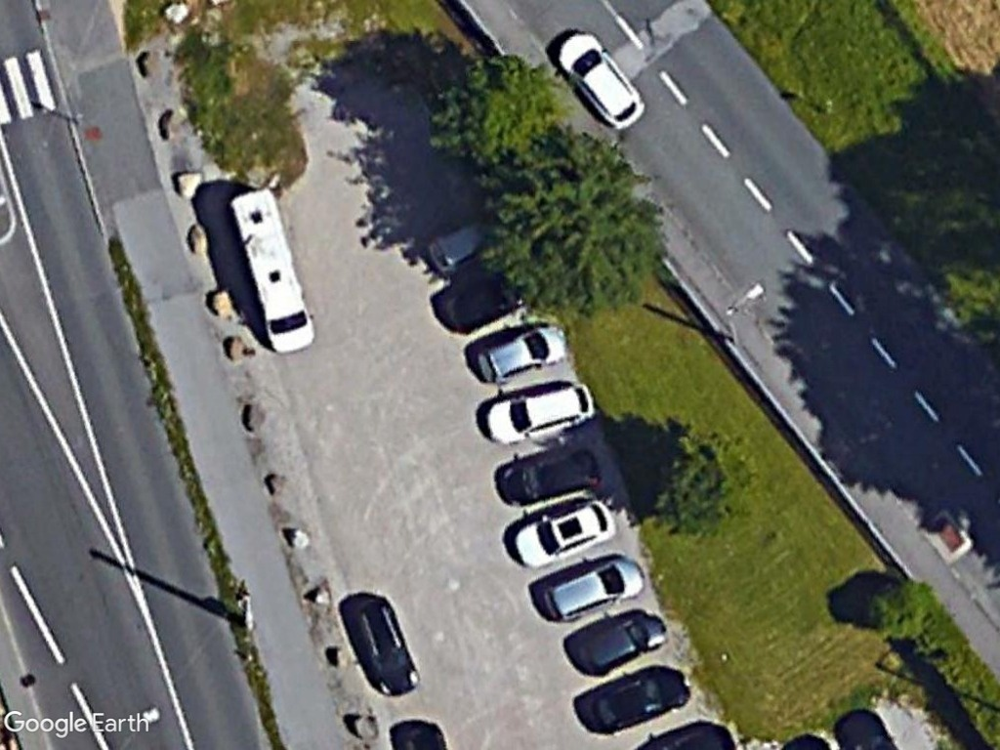

In [27]:
# file path is changable depending of the order in which squeezenet and mobilnet models are run
# here exp may need to be changed to exp2
from IPython.display import Image

Image(filename=f'/content/YOLOv6/runs/inference/exp/{test_sample}', width=416)

In [ ]:
# torch.cuda.empty_cache()


## Replacing backbone with MobileNetV2

In [28]:
import torch.nn as nn


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class MobileNetV2(nn.Module):
    def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
        super().__init__()
        self.conv1 = nn.Conv2d(1280, 64, 1)
        self.conv2 = nn.Conv2d(64, 128, 1)
        self.conv3 = nn.Conv2d(128, 256, 1)
        self.conv4 = nn.Conv2d(256, 512, 1)
        self.model = torchvision.models.mobilenet_v2(pretrained=True)
        # removing the classification head of MobileNetV2
        self.featureExtractor = nn.Sequential(*list(self.model.children()))[:-1]
        self.model.classifier = nn.Identity()
        # freezing the backbone weights
        for param in self.featureExtractor.parameters():
            param.requires_grad=False

    def preprocess(self, image):
        self.preprocess = transforms.Compose([
                          transforms.Resize(256),
                          transforms.CenterCrop(224),
                          transforms.ToTensor(),
                          transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                        ])
        # self.img_path = Image.open(img_path)
        self.input_tensor = self.preprocess(image)
        self.input_batch = self.input_tensor.unsqueeze(0)
        return self.input_batch

    def forward(self, x):
        outputs = []
        x = self.preprocess(x)
        x = self.featureExtractor(x)
        x = self.conv1(x)
        outputs.append(x)
        x = self.conv2(x)
        outputs.append(x)
        x = self.conv3(x)
        outputs.append(x)
        x = self.conv4(x)
        outputs.append(x)
        return tuple(outputs)


In [29]:
from PIL import Image

image_folder = 'data/custom_dataset/image/train'
selected_image = random.choice(os.listdir(image_folder))
image_path = os.path.join(image_folder, selected_image)
input_image = Image.open(image_path)

new_backbone = MobileNetV2()
mobilenet_backbone = new_backbone(input_image)

for feature in mobilenet_backbone:
  print(feature.shape)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 60.5MB/s]


torch.Size([1, 64, 7, 7])
torch.Size([1, 128, 7, 7])
torch.Size([1, 256, 7, 7])
torch.Size([1, 512, 7, 7])


# Making the mobilenetv2.py file

In [30]:
%%shell
cat > /content/YOLOv6/yolov6/models/mobilenetv2.py <<EOF
from torchvision.models.mobilenetv2 import mobilenet_v2
# add some extra layers to custom_model to make it compatible with the Neck
import torch
import torchvision
from torchvision import transforms
import torch.nn as nn


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class MobileNetV2(nn.Module):
    def __init__(self,
            in_channels=None,
            channels_list=None,
            num_repeats=None,
            block=None,
            csp_e=None,
            fuse_P2=None,
            cspsppf=None):
        super().__init__()
        self.conv1 = nn.Conv2d(1280, 64, 1)
        self.conv2 = nn.Conv2d(64, 128, 1)
        self.conv3 = nn.Conv2d(128, 256, 1)
        self.conv4 = nn.Conv2d(256, 512, 1)
        self.model = torchvision.models.mobilenet_v2(pretrained=True)
        # removing the classification head of MobileNetV2
        self.featureExtractor = nn.Sequential(*list(self.model.children()))[:-1]
        self.model.classifier = nn.Identity()
        # freezing the backbone weights
        for param in self.featureExtractor.parameters():
            param.requires_grad=False

    def preprocess(self, image):
        self.preprocess = transforms.Compose([
                          transforms.Resize(256),
                          transforms.CenterCrop(224),
                          transforms.ToTensor(),
                          transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                        ])
        # self.img_path = Image.open(img_path)
        self.input_tensor = self.preprocess(image)
        self.input_batch = self.input_tensor.unsqueeze(0)
        return self.input_batch

    def forward(self, x):
        outputs = []
        # x = self.preprocess(x)
        x = self.featureExtractor(x)
        x = self.conv1(x)
        outputs.append(x)
        x = self.conv2(x)
        outputs.append(x)
        x = self.conv3(x)
        outputs.append(x)
        x = self.conv4(x)
        outputs.append(x)
        return tuple(outputs)

/bin/bash: line 57: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [31]:
!echo 'from yolov6.models.mobilenetv2 import *' >> /content/YOLOv6/yolov6/models/yolo.py
!echo 'from yolov6.models.mobilenetv2 import *' >> /content/YOLOv6/yolov6/models/yolo_lite.py

# Make a cutomized Neck architecture in order to make it compatible with mobilenet

In [32]:
%%shell
cat > /content/YOLOv6/yolov6/models/mobilenet_neck.py << EOF
import torch
from torch import nn
from torch.nn.functional import interpolate
from yolov6.layers.common import RepBlock, RepVGGBlock, BottleRep, BepC3, ConvBNReLU, Transpose, BiFusion, \
                                MBLABlock, ConvBNHS, CSPBlock, DPBlock



class RepBiFPANNeckMobilNetV2(nn.Module):
    def __init__(
        self,
        channels_list=None,
        num_repeats=None,
        block=RepVGGBlock
    ):
        super().__init__()

        assert channels_list is not None
        assert num_repeats is not None

        self.reduce_layer0 = ConvBNReLU(
            in_channels=channels_list[4], # 1024
            out_channels=channels_list[5], # 256
            kernel_size=1,
            stride=1
        )

        self.Bifusion0 = BiFusion(
            in_channels=[channels_list[3], channels_list[2]], # 512, 256
            out_channels=channels_list[5], # 256
        )
        self.Rep_p4 = RepBlock(
            in_channels=channels_list[5], # 256
            out_channels=channels_list[5], # 256
            n=num_repeats[5],
            block=block
        )

        self.reduce_layer1 = ConvBNReLU(
            in_channels=channels_list[5], # 256
            out_channels=channels_list[6], # 128
            kernel_size=1,
            stride=1
        )

        self.Bifusion1 = BiFusion(
            in_channels=[channels_list[2], channels_list[1]], # 256, 128
            out_channels=channels_list[6], # 128
        )

        self.Rep_p3 = RepBlock(
            in_channels=channels_list[6], # 128
            out_channels=channels_list[6], # 128
            n=num_repeats[6],
            block=block
        )

        self.downsample2 = ConvBNReLU(
            in_channels=channels_list[6], # 128
            out_channels=channels_list[7], # 128
            kernel_size=3,
            stride=2
        )

        self.Rep_n3 = RepBlock(
            in_channels=channels_list[6] + channels_list[7], # 128 + 128
            out_channels=channels_list[8], # 256
            n=num_repeats[7],
            block=block
        )

        self.downsample1 = ConvBNReLU(
            in_channels=channels_list[8], # 256
            out_channels=channels_list[9], # 256
            kernel_size=3,
            stride=2
        )

        self.Rep_n4 = RepBlock(
            in_channels=channels_list[5] + channels_list[9], # 256 + 256
            out_channels=channels_list[10], # 512
            n=num_repeats[8],
            block=block
        )

        self.upsample0 = nn.Upsample(
          size=(40, 40),
          mode='bilinear',
          align_corners=True
        )

        self.upsample1 = nn.Upsample(
          size=(80, 80),
          mode='bilinear',
          align_corners=True
        )

        self.upsample2 = nn.Upsample(
          size=(160, 160),
          mode='bilinear',
          align_corners=True
        )

        self.upsample3 = nn.Upsample(
          size=(320, 320),
          mode='bilinear',
          align_corners=True
        )

    def forward(self, input):

        (x3, x2, x1, x0) = input
        x0 = self.upsample0(x0)
        x0_upsampled = torch.cat((x0, x0), dim=0)
        x1 = self.upsample1(x1)
        x1_upsampled = torch.cat((x1, x1), dim=0)
        x2 = self.upsample2(x2)
        x2_upsampled = torch.cat((x2, x2), dim=0)
        x3 = self.upsample3(x3)
        x3_upsampled = torch.cat((x3, x3), dim=0)

        fpn_out0 = self.reduce_layer0(x0_upsampled)
        f_concat_layer0 = self.Bifusion0([fpn_out0, x1_upsampled, x2_upsampled])
        f_out0 = self.Rep_p4(f_concat_layer0)
        fpn_out1 = self.reduce_layer1(f_out0)
        f_concat_layer1 = self.Bifusion1([fpn_out1, x2_upsampled, x3_upsampled])
        pan_out2 = self.Rep_p3(f_concat_layer1)
        down_feat1 = self.downsample2(pan_out2)
        p_concat_layer1 = torch.cat([down_feat1, fpn_out1], 1)
        pan_out1 = self.Rep_n3(p_concat_layer1)
        down_feat0 = self.downsample1(pan_out1)
        p_concat_layer2 = torch.cat([down_feat0, fpn_out0], 1)
        pan_out0 = self.Rep_n4(p_concat_layer2)

        outputs = [pan_out2, pan_out1, pan_out0]

        return outputs

/bin/bash: line 137: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [33]:
!echo 'from yolov6.models.mobilenet_neck import *' >> /content/YOLOv6/yolov6/models/yolo.py
!echo 'from yolov6.models.mobilenet_neck import *' >> /content/YOLOv6/yolov6/models/yolo_lite.py

# Make yolov6s_funetune_mbl.py file

In [34]:
%%shell
cat > /content/YOLOv6/configs/yolov6s_finetune_mbl.py << EOF
# YOLOv6s model
model = dict(
    type='YOLOv6s',
    pretrained='weights/yolov6s.pt',
    depth_multiple=0.33,
    width_multiple=0.50,
    backbone=dict(
        type='MobileNetV2',
        num_repeats=[1, 6, 12, 18, 6],
        out_channels=[64, 128, 256, 512, 1024],
        fuse_P2=True,
        cspsppf=True,
        ),
    neck=dict(
        type='RepBiFPANNeckMobilNetV2',
        num_repeats=[12, 12, 12, 12],
        out_channels=[256, 128, 128, 256, 256, 512],
        ),
    head=dict(
        type='EffiDeHead',
        in_channels=[128, 256, 512],
        num_layers=3,
        begin_indices=24,
        anchors=3,
        anchors_init=[[10,13, 19,19, 33,23],
                      [30,61, 59,59, 59,119],
                      [116,90, 185,185, 373,326]],
        out_indices=[17, 20, 23],
        strides=[8, 16, 32],
        atss_warmup_epoch=0,
        iou_type='giou',
        use_dfl=False, # set to True if you want to further train with distillation
        reg_max=0, # set to 16 if you want to further train with distillation
        distill_weight={
            'class': 1.0,
            'dfl': 1.0,
        },
    )
)

solver = dict(
    optim='SGD',
    lr_scheduler='Cosine',
    lr0=0.0032,
    lrf=0.12,
    momentum=0.843,
    weight_decay=0.00036,
    warmup_epochs=2.0,
    warmup_momentum=0.5,
    warmup_bias_lr=0.05
)

data_aug = dict(
    hsv_h=0.0138,
    hsv_s=0.664,
    hsv_v=0.464,
    degrees=0.373,
    translate=0.245,
    scale=0.898,
    shear=0.602,
    flipud=0.00856,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.243,
)


/bin/bash: line 65: warning: here-document at line 0 delimited by end-of-file (wanted `EOF')


In [35]:
!pip install addict
!pip install thop

output.clear()

In [36]:
!python tools/train.py --batch 4 --epochs 1 --conf configs/yolov6s_finetune_mbl.py --data data/data_yolov6.yaml --img 610 --rec

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
--img-size 610 must be multiple of max stride 32, updating to 640
Using 1 GPU for training... 
training args are: Namespace(data_path='data/data_yolov6.yaml', conf_file='configs/yolov6s_finetune_mbl.py', img_size=640, rect=True, batch_size=4, epochs=1, workers=8, device='0', eval_interval=20, eval_f

In [37]:
# file path is changable depending of the order in which squeezenet and mobilnet models are run
# here exp2 may need to be changed to exp1
!python tools/eval.py --data data/data_yolov6.yaml --batch 4 --weights runs/train/exp1/weights/best_ckpt.pt --task val --reproduce_640_eval

Namespace(data='data/data_yolov6.yaml', weights='runs/train/exp1/weights/best_ckpt.pt', batch_size=4, img_size=640, conf_thres=0.03, iou_thres=0.65, task='val', device='0', half=False, save_dir='runs/val/', name='exp', shrink_size=2, infer_on_rect=False, reproduce_640_eval=True, eval_config_file='./configs/experiment/eval_640_repro.py', do_coco_metric=True, do_pr_metric=False, plot_curve=True, plot_confusion_matrix=False, verbose=False, config_file='', specific_shape=False, height=None, width=None)
Loading checkpoint from runs/train/exp1/weights/best_ckpt.pt
Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' ar

In [38]:
test_folder = 'data/custom_dataset/image/test'
test_sample = random.choice(os.listdir(test_folder))
if test_sample.endswith('.jpg'):
  image_path = os.path.join(test_folder, test_sample)

In [39]:
# file path is changable depending of the order in which squeezenet and mobilnet models are run
# here exp2 may need to be changed to exp1
!python tools/infer.py --weights runs/train/exp1/weights/best_ckpt.pt --source {image_path}

Namespace(weights='runs/train/exp1/weights/best_ckpt.pt', source='data/custom_dataset/image/test/4081.jpg', webcam=False, webcam_addr='0', yaml='data/coco.yaml', img_size=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device='0', save_txt=False, not_save_img=False, save_dir=None, view_img=False, classes=None, agnostic_nms=False, project='runs/inference', name='exp', hide_labels=False, hide_conf=False, half=False)
Save directory already existed
Loading checkpoint from runs/train/exp1/weights/best_ckpt.pt
Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in

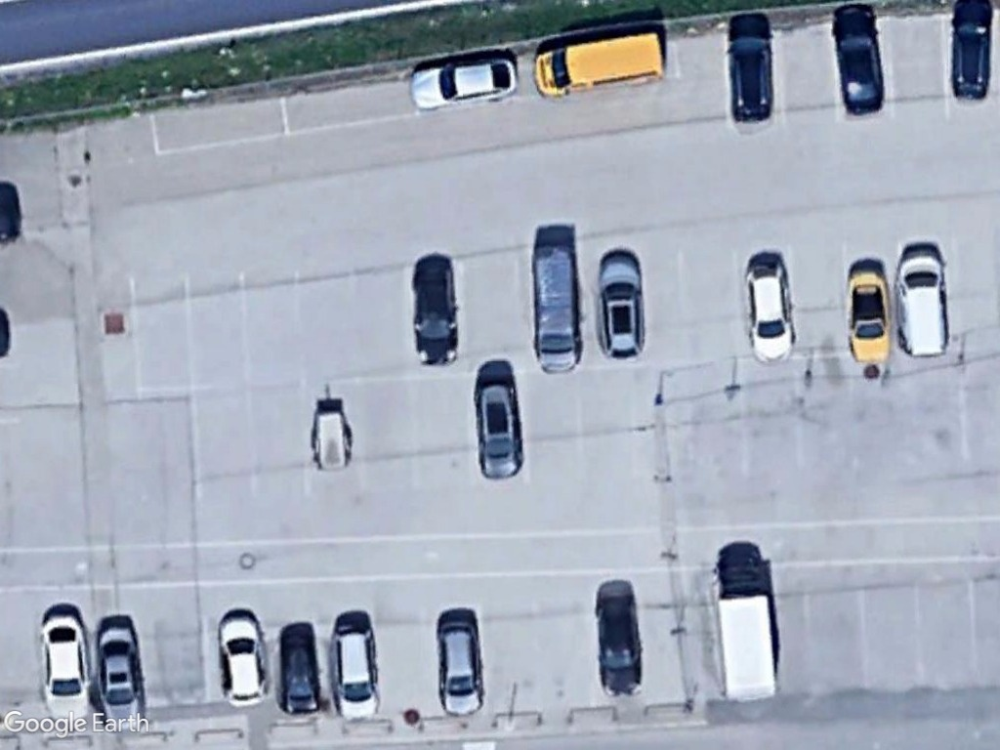

In [40]:
# file path is changable depending of the order in which squeezenet and mobilnet models are run
# here exp may need to be changed to exp1
from IPython.display import Image

Image(filename=f'/content/YOLOv6/runs/inference/exp/{test_sample}', width=416)